In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#주피터에서 실행결과 여러줄 보여주고싶을때
# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"
import squarify
import seaborn as sns
import folium

In [2]:
#폰트 확인

import matplotlib.font_manager as fm
fontlist = fm.findSystemFonts(fontpaths=None, fontext='ttf')

f = [f.name for f in fm.fontManager.ttflist]
print(f'{f} \n')

# 한글 폰트 경로 설정 (예: 맑은 고딕)
font_path = r'C:\Windows\Fonts\malgun.ttf'  # Windows 기준
font_prop = fm.FontProperties(fname=font_path)

# 폰트 설정 적용
plt.rcParams['font.family'] = font_prop.get_name()

['cmsy10', 'cmr10', 'DejaVu Sans', 'cmex10', 'STIXSizeThreeSym', 'DejaVu Sans Display', 'DejaVu Sans Mono', 'DejaVu Serif', 'STIXSizeThreeSym', 'STIXSizeTwoSym', 'STIXSizeTwoSym', 'DejaVu Sans', 'STIXSizeFourSym', 'cmtt10', 'STIXNonUnicode', 'DejaVu Sans Mono', 'cmmi10', 'STIXGeneral', 'DejaVu Serif', 'DejaVu Serif Display', 'DejaVu Sans', 'STIXSizeFourSym', 'STIXNonUnicode', 'STIXNonUnicode', 'cmss10', 'DejaVu Sans Mono', 'DejaVu Sans Mono', 'STIXSizeOneSym', 'DejaVu Serif', 'STIXGeneral', 'DejaVu Serif', 'DejaVu Sans', 'STIXSizeOneSym', 'STIXGeneral', 'STIXGeneral', 'STIXSizeFiveSym', 'cmb10', 'STIXNonUnicode', 'SimSun', 'Georgia', 'Harlow Solid Italic', 'Tw Cen MT Condensed', 'Candara', 'Tw Cen MT', 'Segoe UI', 'Bernard MT Condensed', 'MS Reference Sans Serif', 'Calisto MT', 'Arial', 'HCR Dotum Ext', 'Informal Roman', 'Palatino Linotype', 'Freestyle Script', 'Segoe Fluent Icons', 'Arial', 'Leelawadee UI', 'Book Antiqua', 'Arial', 'Material Design Icons', 'Californian FB', 'Georgia',

In [3]:
df =pd.read_csv('./서울특별시_일반음식점.csv', sep=',', encoding='cp949')
df.head(10)

C:\Users\user\AppData\Local\Temp\ipykernel_18688\3397017031.py:1: DtypeWarning: Columns (22,27,39,41,44,45) have mixed types. Specify dtype option on import or set low_memory=False.
  df =pd.read_csv('./서울특별시_일반음식점.csv', sep=',', encoding='cp949')


,번호,개방서비스명,개방서비스아이디,개방자치단체코드,관리번호,인허가일자,인허가취소일자,영업상태구분코드,영업상태명,상세영업상태코드,...,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모,전통업소지정번호,전통업소주된음식,홈페이지,Unnamed: 47
0,1,일반음식점,07_24_04_P,3150000,3150000-101-2020-00448,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,35.19,NaN,NaN,NaN,NaN
1,2,일반음식점,07_24_04_P,3150000,3150000-101-2020-00449,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,50.37,NaN,NaN,NaN,NaN
2,3,일반음식점,07_24_04_P,3220000,3220000-101-2020-00851,20200803,NaN,1,영업/정상,1,...,0.0,NaN,0.0,0.0,N,13.65,NaN,NaN,NaN,NaN
3,4,일반음식점,07_24_04_P,3220000,3220000-101-2020-00853,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,Y,123.30,NaN,NaN,NaN,NaN
4,5,일반음식점,07_24_04_P,3220000,3220000-101-2020-00855,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,8.26,NaN,NaN,NaN,NaN
5,6,일반음식점,07_24_04_P,3220000,3220000-101-2020-00856,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,Y,115.00,NaN,NaN,NaN,NaN
6,7,일반음식점,07_24_04_P,3040000,3040000-101-2020-00273,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,15.39,NaN,NaN,NaN,NaN
7,8,일반음식점,07_24_04_P,3040000,3040000-101-2020-00276,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,112.91,NaN,NaN,NaN,NaN
8,9,일반음식점,07_24_04_P,3110000,3110000-101-2020-00280,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,40.00,NaN,NaN,NaN,NaN
9,10,일반음식점,07_24_04_P,3110000,3110000-101-2020-00281,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,63.44,NaN,NaN,NaN,NaN


In [102]:
#서대문구 치킨집 개수 트리맵으로
#파이그래프,히트맵,막대그래프, 히트맵 등 다양하게
#치킨집 분포 확인하는게 목표

In [103]:
df['사업장명'],
df[df['업태구분명']=='호프/통닭'].head()
df[df['업태구분명']=='통닭(치킨)'].head()

(0                   혼밥대왕 마곡점
 1                꾸어가게생선구이화곡점
 2                      인생갈비탕
 3                놀부 공유주방 선릉역
 4                        온기정
                  ...        
 472910      샐러드랩 샐랩 춘하추동프로젝트
 472911                  노지푸드
 472912    포베이키친밸리논현2호점 주방22호
 472913                개성진 만두
 472914                  동행포차
 Name: 사업장명, Length: 472915, dtype: object,)

,번호,개방서비스명,개방서비스아이디,개방자치단체코드,관리번호,인허가일자,인허가취소일자,영업상태구분코드,영업상태명,상세영업상태코드,...,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모,전통업소지정번호,전통업소주된음식,홈페이지,Unnamed: 47
30,31,일반음식점,07_24_04_P,3110000,3110000-101-1999-06737,19991113,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,60.28,NaN,NaN,NaN,NaN
43,44,일반음식점,07_24_04_P,3180000,3180000-101-2001-14282,20010818,NaN,1,영업/정상,1,...,0.0,NaN,0.0,0.0,N,12.00,NaN,NaN,NaN,NaN
44,45,일반음식점,07_24_04_P,3010000,3010000-101-2001-13779,20010521,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,28.60,NaN,NaN,NaN,NaN
66,67,일반음식점,07_24_04_P,3000000,3000000-101-2002-11870,20020205,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,41.87,NaN,NaN,NaN,NaN
67,68,일반음식점,07_24_04_P,3210000,3210000-101-2000-15274,20001201,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,19.80,NaN,NaN,NaN,NaN


,번호,개방서비스명,개방서비스아이디,개방자치단체코드,관리번호,인허가일자,인허가취소일자,영업상태구분코드,영업상태명,상세영업상태코드,...,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모,전통업소지정번호,전통업소주된음식,홈페이지,Unnamed: 47
178,179,일반음식점,07_24_04_P,3120000,3120000-101-1997-05915,19970217,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,147.90,NaN,NaN,NaN,NaN
241,242,일반음식점,07_24_04_P,3110000,3110000-101-2014-00038,20140224,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,58.55,NaN,NaN,NaN,NaN
270,271,일반음식점,07_24_04_P,3110000,3110000-101-2014-00321,20141021,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,85.80,NaN,NaN,NaN,NaN
302,303,일반음식점,07_24_04_P,3110000,3110000-101-1999-06735,19991113,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,23.95,NaN,NaN,NaN,NaN
384,385,일반음식점,07_24_04_P,3110000,3110000-101-2001-07849,20010409,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,39.60,NaN,NaN,NaN,NaN


In [27]:
chicken_w = df.loc[df['영업상태구분코드']==1 & df['업태구분명'].str.contains('호프|통닭|치킨')]
chicken_w= chicken_w.reset_index(drop=True, names='index')
chicken_w.drop('번호', axis=1,inplace=True)

In [117]:
#업태구분명이 호프/통닭 이거나 통닭(치킨)이고 현재 영업중인 영업상태 1인 가게들
chicken_w.head()

,개방서비스명,개방서비스아이디,개방자치단체코드,관리번호,인허가일자,인허가취소일자,영업상태구분코드,영업상태명,상세영업상태코드,상세영업상태명,...,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모,전통업소지정번호,전통업소주된음식,홈페이지,Unnamed: 47
0,일반음식점,07_24_04_P,3110000,3110000-101-1999-06737,19991113,NaN,1,영업/정상,1,영업,...,NaN,NaN,NaN,NaN,N,60.28,NaN,NaN,NaN,NaN
1,일반음식점,07_24_04_P,3180000,3180000-101-2001-14282,20010818,NaN,1,영업/정상,1,영업,...,0.0,NaN,0.0,0.0,N,12.00,NaN,NaN,NaN,NaN
2,일반음식점,07_24_04_P,3010000,3010000-101-2001-13779,20010521,NaN,1,영업/정상,1,영업,...,NaN,NaN,NaN,NaN,N,28.60,NaN,NaN,NaN,NaN
3,일반음식점,07_24_04_P,3000000,3000000-101-2002-11870,20020205,NaN,1,영업/정상,1,영업,...,NaN,NaN,NaN,NaN,N,41.87,NaN,NaN,NaN,NaN
4,일반음식점,07_24_04_P,3210000,3210000-101-2000-15274,20001201,NaN,1,영업/정상,1,영업,...,NaN,NaN,NaN,NaN,N,19.80,NaN,NaN,NaN,NaN


In [118]:
chicken_w['소재지전체주소']  = chicken_w['소재지전체주소'].fillna(chicken_w['도로명전체주소'])
chicken_w['소재지전체주소'].isnull().sum()

0

In [119]:
chicken_w.head()

,개방서비스명,개방서비스아이디,개방자치단체코드,관리번호,인허가일자,인허가취소일자,영업상태구분코드,영업상태명,상세영업상태코드,상세영업상태명,...,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모,전통업소지정번호,전통업소주된음식,홈페이지,Unnamed: 47
0,일반음식점,07_24_04_P,3110000,3110000-101-1999-06737,19991113,NaN,1,영업/정상,1,영업,...,NaN,NaN,NaN,NaN,N,60.28,NaN,NaN,NaN,NaN
1,일반음식점,07_24_04_P,3180000,3180000-101-2001-14282,20010818,NaN,1,영업/정상,1,영업,...,0.0,NaN,0.0,0.0,N,12.00,NaN,NaN,NaN,NaN
2,일반음식점,07_24_04_P,3010000,3010000-101-2001-13779,20010521,NaN,1,영업/정상,1,영업,...,NaN,NaN,NaN,NaN,N,28.60,NaN,NaN,NaN,NaN
3,일반음식점,07_24_04_P,3000000,3000000-101-2002-11870,20020205,NaN,1,영업/정상,1,영업,...,NaN,NaN,NaN,NaN,N,41.87,NaN,NaN,NaN,NaN
4,일반음식점,07_24_04_P,3210000,3210000-101-2000-15274,20001201,NaN,1,영업/정상,1,영업,...,NaN,NaN,NaN,NaN,N,19.80,NaN,NaN,NaN,NaN


In [120]:
f_add =chicken_w['소재지전체주소'].values.tolist()

#업태가 치킨인 구와 동
gu=[]
dong=[]
for i in f_add:
  gu.append(i.split(sep=' ')[1])
  
for i in f_add:
  dong.append(i.split(sep=' ')[2])	

In [121]:
chicken_w['지역구'] = gu
chicken_w['동이름'] = dong

In [122]:
chicken_w.head()

,개방서비스명,개방서비스아이디,개방자치단체코드,관리번호,인허가일자,인허가취소일자,영업상태구분코드,영업상태명,상세영업상태코드,상세영업상태명,...,보증액,월세액,다중이용업소여부,시설총규모,전통업소지정번호,전통업소주된음식,홈페이지,Unnamed: 47,지역구,동이름
0,일반음식점,07_24_04_P,3110000,3110000-101-1999-06737,19991113,NaN,1,영업/정상,1,영업,...,NaN,NaN,N,60.28,NaN,NaN,NaN,NaN,은평구,갈현동
1,일반음식점,07_24_04_P,3180000,3180000-101-2001-14282,20010818,NaN,1,영업/정상,1,영업,...,0.0,0.0,N,12.00,NaN,NaN,NaN,NaN,영등포구,양평동3가
2,일반음식점,07_24_04_P,3010000,3010000-101-2001-13779,20010521,NaN,1,영업/정상,1,영업,...,NaN,NaN,N,28.60,NaN,NaN,NaN,NaN,중구,필동2가
3,일반음식점,07_24_04_P,3000000,3000000-101-2002-11870,20020205,NaN,1,영업/정상,1,영업,...,NaN,NaN,N,41.87,NaN,NaN,NaN,NaN,종로구,당주동
4,일반음식점,07_24_04_P,3210000,3210000-101-2000-15274,20001201,NaN,1,영업/정상,1,영업,...,NaN,NaN,N,19.80,NaN,NaN,NaN,NaN,서초구,우면동


In [123]:
chicken_w_seo = chicken_w[chicken_w['지역구']=='서대문구']

In [124]:
#동별 치킨집 개수

chicken_count = chicken_w_seo['동이름'].value_counts()
chicken_count = chicken_count.to_dict()

label = list(chicken_count.keys())
size = list(chicken_count.values())

<Figure size 800x600 with 0 Axes>

<Axes: >

Text(0.5, 1.0, '서대문구 동별 치킨집 트리맵')

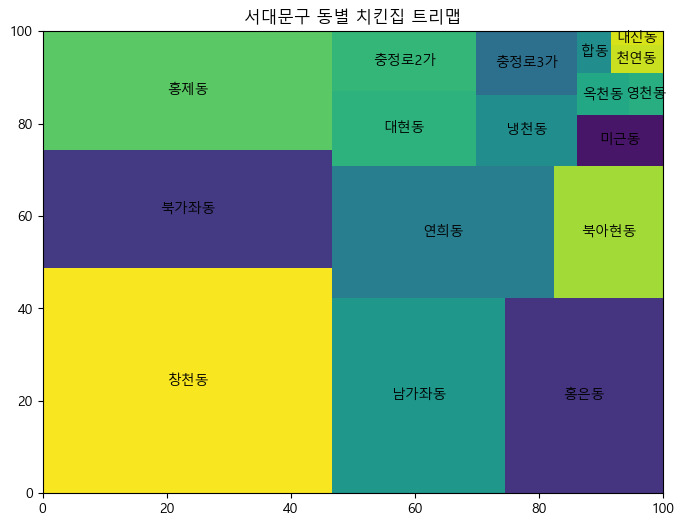

In [125]:
plt.figure(figsize=(8,6))
squarify.plot(sizes=size, label=label)
plt.title('서대문구 동별 치킨집 트리맵')
plt.savefig('./서대문구 동별 치킨집 트리맵')
plt.show()

<Figure size 800x600 with 0 Axes>

<Axes: >

Text(0.5, 1.0, '서울 구별 치킨 트리맵')

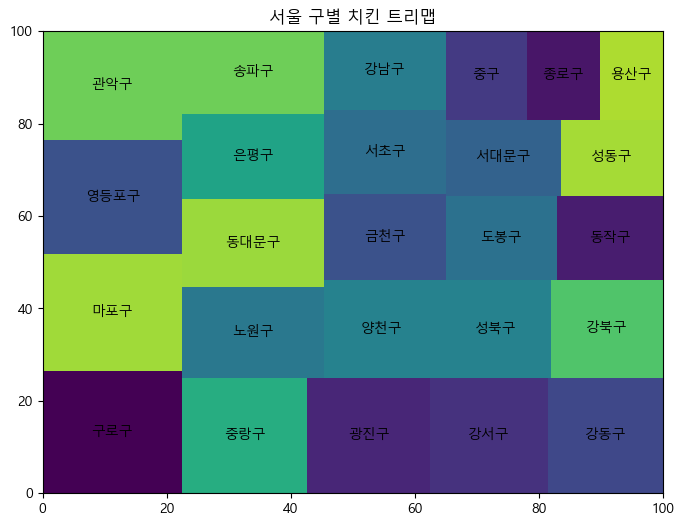

In [126]:
#구별 치킨집 개수

chicken_whole =  chicken_w['지역구'].value_counts().to_dict()

label = list(chicken_whole.keys())
size = list(chicken_whole.values())

plt.figure(figsize=(8,6))
squarify.plot(sizes=size, label=label)
plt.title('서울 구별 치킨 트리맵')

plt.savefig('./서울 구별 치킨집 트리맵')
plt.show()

In [127]:
df.head()

,번호,개방서비스명,개방서비스아이디,개방자치단체코드,관리번호,인허가일자,인허가취소일자,영업상태구분코드,영업상태명,상세영업상태코드,...,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모,전통업소지정번호,전통업소주된음식,홈페이지,Unnamed: 47
0,1,일반음식점,07_24_04_P,3150000,3150000-101-2020-00448,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,35.19,NaN,NaN,NaN,NaN
1,2,일반음식점,07_24_04_P,3150000,3150000-101-2020-00449,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,50.37,NaN,NaN,NaN,NaN
2,3,일반음식점,07_24_04_P,3220000,3220000-101-2020-00851,20200803,NaN,1,영업/정상,1,...,0.0,NaN,0.0,0.0,N,13.65,NaN,NaN,NaN,NaN
3,4,일반음식점,07_24_04_P,3220000,3220000-101-2020-00853,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,Y,123.30,NaN,NaN,NaN,NaN
4,5,일반음식점,07_24_04_P,3220000,3220000-101-2020-00855,20200803,NaN,1,영업/정상,1,...,NaN,NaN,NaN,NaN,N,8.26,NaN,NaN,NaN,NaN


In [128]:
#소재지 전체주소가 비어있을경우 도로명주소를 가지고와서 최대한 결측치를 제거거
df['소재지전체주소']=df['소재지전체주소'].fillna('도로명전체주소')

In [129]:
#소재지 주소를 리스트화해서 하나씩 접근가능하도록
df_add =df['소재지전체주소'].values.tolist()

#모든 소재지에 대해 구/동 분리작업
whole_gu=[]
whole_dong=[]
for address in df_add:
		parts = address.split()
		if len(parts) > 2:
				whole_gu.append(parts[1]) #구 저장
				whole_dong.append(parts[2])#동 저장
		else:
				whole_gu.append('')
				whole_dong.append('')

In [130]:
#기존 데이터프레임에 지역구,동이름 컬럼을 추가
df['지역구'] = whole_gu
df['동이름'] = whole_dong

#지역구 명으로 데이터프레임에 조건을 걸어서 진행하기위해 리스트화
gu_list = df['지역구'].unique().tolist()

In [131]:
df.reset_index(names='번호',drop=True).head()

,번호,개방서비스명,개방서비스아이디,개방자치단체코드,관리번호,인허가일자,인허가취소일자,영업상태구분코드,영업상태명,상세영업상태코드,...,보증액,월세액,다중이용업소여부,시설총규모,전통업소지정번호,전통업소주된음식,홈페이지,Unnamed: 47,지역구,동이름
0,1,일반음식점,07_24_04_P,3150000,3150000-101-2020-00448,20200803,NaN,1,영업/정상,1,...,NaN,NaN,N,35.19,NaN,NaN,NaN,NaN,강서구,마곡동
1,2,일반음식점,07_24_04_P,3150000,3150000-101-2020-00449,20200803,NaN,1,영업/정상,1,...,NaN,NaN,N,50.37,NaN,NaN,NaN,NaN,강서구,화곡동
2,3,일반음식점,07_24_04_P,3220000,3220000-101-2020-00851,20200803,NaN,1,영업/정상,1,...,0.0,0.0,N,13.65,NaN,NaN,NaN,NaN,강남구,역삼동
3,4,일반음식점,07_24_04_P,3220000,3220000-101-2020-00853,20200803,NaN,1,영업/정상,1,...,NaN,NaN,Y,123.30,NaN,NaN,NaN,NaN,강남구,대치동
4,5,일반음식점,07_24_04_P,3220000,3220000-101-2020-00855,20200803,NaN,1,영업/정상,1,...,NaN,NaN,N,8.26,NaN,NaN,NaN,NaN,강남구,삼성동


In [132]:
#서대문구에 운영중인 치킨집 개수
len(df.loc[(df['영업상태구분코드']==1) & (df['지역구']=='서대문구') & (df['업태구분명'].str.contains('호프|통닭|치킨'))])

#서대문구에 폐업한 치킨집 개수
len(df.loc[(df['영업상태구분코드']==3) & (df['지역구']=='서대문구')& (df['업태구분명'].str.contains('호프|통닭|치킨'))])

400

732

In [133]:
#각 구에서 운영중인 치킨집 개수
chicken_working_gu = {}

for gu_name in gu_list :
  count = len(df[(df['영업상태구분코드'] == 1) &
							(df['지역구'] == gu_name) & 
							(df['업태구분명'].str.contains('호프|통닭|치킨'))])
  chicken_working_gu[gu_name] = count
  result_list = [{'구': gu, '개수': count} for gu, count in chicken_working_gu.items()]

In [37]:
#치킨집을 운영하는 구의 데이터 중 key와 value에 0값이 들어간 데이터 삭제
chicken_working_gu = {k: v for k, v in chicken_working_gu.items() if v != 0}
chicken_working_gu = {k: v for k, v in chicken_working_gu.items() if k !=''}
chicken_working_gu

{'강서구': 625,
 '강남구': 435,
 '광진구': 650,
 '은평구': 554,
 '성북구': 500,
 '송파구': 536,
 '중구': 329,
 '서대문구': 400,
 '영등포구': 729,
 '서초구': 472,
 '종로구': 293,
 '용산구': 255,
 '양천구': 513,
 '중랑구': 663,
 '성동구': 355,
 '강북구': 495,
 '마포구': 743,
 '관악구': 693,
 '동작구': 409,
 '구로구': 783,
 '강동구': 605,
 '도봉구': 431,
 '동대문구': 570,
 '금천구': 479,
 '노원구': 586}

In [38]:
#각 구에서 폐업한 치킨집 개수
chicken_closed_gu = {}

for gu_name in gu_list :
  count = len(df[(df['영업상태구분코드'] == 3) &
							(df['지역구'] == gu_name) & 
							(df['업태구분명'].str.contains('호프|통닭|치킨'))])
  chicken_closed_gu[gu_name] = count
  result_list_closed = [{'구': gu, '개수': count} for gu, count in chicken_closed_gu.items()]

In [39]:
#치킨집을 폐업한 구의 데이터 중 key와 value에 0값이 들어간 데이터 삭제
chicken_closed_gu = {k: v for k, v in chicken_closed_gu.items() if v != 0}
chicken_closed_gu = {k: v for k, v in chicken_closed_gu.items() if k !=''}
chicken_closed_gu

{'강서구': 1042,
 '강남구': 732,
 '광진구': 1509,
 '은평구': 1471,
 '성북구': 1304,
 '송파구': 1214,
 '중구': 389,
 '서대문구': 732,
 '영등포구': 1430,
 '서초구': 1151,
 '종로구': 232,
 '용산구': 386,
 '양천구': 1963,
 '중랑구': 1621,
 '성동구': 1154,
 '강북구': 1186,
 '마포구': 2076,
 '관악구': 1676,
 '동작구': 776,
 '구로구': 1917,
 '강동구': 2186,
 '도봉구': 1101,
 '동대문구': 1635,
 '금천구': 1233,
 '노원구': 1237,
 '성남시': 1}

In [40]:
#딕셔너리타입의 키와 밸류를 분류하여 처리하기 편하게 리스트로
w_gu_label = list(chicken_working_gu.keys())
w_gu_value = list(chicken_working_gu.values())
c_gu_label = list(chicken_closed_gu.keys())
c_gu_value = list(chicken_closed_gu.values())

In [47]:
# #데이터 검증시 불필요한 성남시가 들어가있어서 삭제
# del c_gu_label[-1]
# del c_gu_value[-1]

In [46]:
#데이터 길이 확인
len(w_gu_label)
len(w_gu_value)
len(c_gu_label)
len(c_gu_value)

25

25

26

26

In [48]:
chikchik = pd.DataFrame({'구이름' : w_gu_label, '영업중': w_gu_value, '폐업': c_gu_value})


In [49]:
#폐업률 추가
close_rate = [(closed /(working+closed))*100 for working, closed in zip(chikchik['영업중'],chikchik['폐업'])]
close_rate
chikchik['폐업률'] = close_rate

[62.50749850029994,
 62.724935732647815,
 69.8934691987031,
 72.64197530864197,
 72.28381374722838,
 69.37142857142857,
 54.1782729805014,
 64.66431095406361,
 66.23436776285317,
 70.91805298829328,
 44.19047619047619,
 60.218408736349446,
 79.281098546042,
 70.97197898423818,
 76.47448641484426,
 70.55324211778704,
 73.64313586378148,
 70.7471506964964,
 65.48523206751055,
 71.0,
 78.32318165532067,
 71.8668407310705,
 74.14965986394559,
 72.02102803738318,
 67.85518376302797]

In [50]:
chikchik

,구이름,영업중,폐업,폐업률
0,강서구,625,1042,62.507499
1,강남구,435,732,62.724936
2,광진구,650,1509,69.893469
3,은평구,554,1471,72.641975
4,성북구,500,1304,72.283814
5,송파구,536,1214,69.371429
6,중구,329,389,54.178273
7,서대문구,400,732,64.664311
8,영등포구,729,1430,66.234368
9,서초구,472,1151,70.918053


<Figure size 1500x600 with 0 Axes>

Text(0.5, 1.0, '서울 구별 치킨 폐업률')

Text(0, 0.5, '폐업률%')

Text(0.5, 0, '지역구')

C:\Users\user\AppData\Local\Temp\ipykernel_16768\4155158162.py:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


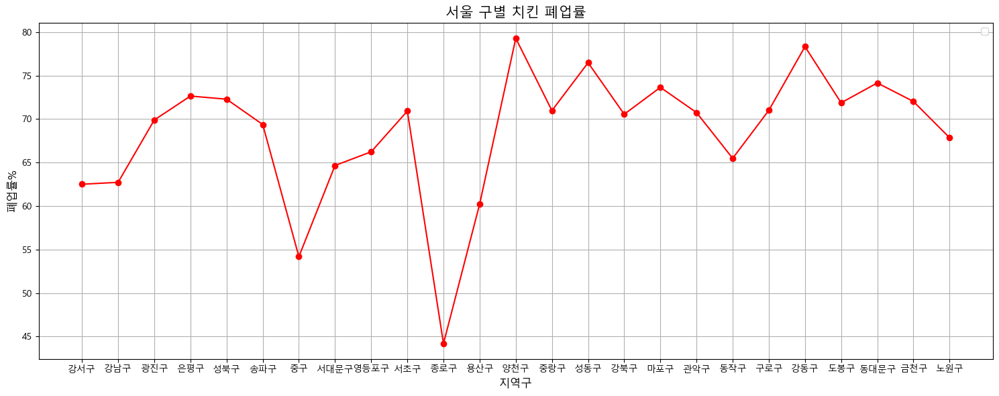

In [55]:
#구 별 폐업률 보여주기
label_1 =chikchik['구이름']
c_rate =chikchik['폐업률']

plt.figure(figsize=(15,6))
plt.plot(label_1,c_rate, 'ro-')
plt.grid()
plt.title('서울 구별 치킨 폐업률', fontsize='15')
plt.ylabel('폐업률%',fontsize='12')
plt.xlabel('지역구',fontsize='12')
plt.legend()

plt.savefig('./서울 구별 폐업률 현황')
plt.tight_layout()
plt.show()

In [52]:
chikchik_melt = pd.melt(chikchik, id_vars=['구이름'], var_name='상태', value_name='개수')


In [70]:
#폐업률 데이터 삭제하기
chikchik_melt = chikchik_melt[chikchik_melt['상태']!='폐업률']

<Figure size 1500x600 with 0 Axes>

Text(0.5, 1.0, '서울 구별 치킨집 영업 및 폐업 현황')

Text(0.5, 0, '구 이름')

Text(0, 0.5, '치킨집 수')

[Text(0, 2, '625'),
 Text(0, 2, '435'),
 Text(0, 2, '650'),
 Text(0, 2, '554'),
 Text(0, 2, '500'),
 Text(0, 2, '536'),
 Text(0, 2, '329'),
 Text(0, 2, '400'),
 Text(0, 2, '729'),
 Text(0, 2, '472'),
 Text(0, 2, '293'),
 Text(0, 2, '255'),
 Text(0, 2, '513'),
 Text(0, 2, '663'),
 Text(0, 2, '355'),
 Text(0, 2, '495'),
 Text(0, 2, '743'),
 Text(0, 2, '693'),
 Text(0, 2, '409'),
 Text(0, 2, '783'),
 Text(0, 2, '605'),
 Text(0, 2, '431'),
 Text(0, 2, '570'),
 Text(0, 2, '479'),
 Text(0, 2, '586')]

[Text(0, 2, '1042'),
 Text(0, 2, '732'),
 Text(0, 2, '1509'),
 Text(0, 2, '1471'),
 Text(0, 2, '1304'),
 Text(0, 2, '1214'),
 Text(0, 2, '389'),
 Text(0, 2, '732'),
 Text(0, 2, '1430'),
 Text(0, 2, '1151'),
 Text(0, 2, '232'),
 Text(0, 2, '386'),
 Text(0, 2, '1963'),
 Text(0, 2, '1621'),
 Text(0, 2, '1154'),
 Text(0, 2, '1186'),
 Text(0, 2, '2076'),
 Text(0, 2, '1676'),
 Text(0, 2, '776'),
 Text(0, 2, '1917'),
 Text(0, 2, '2186'),
 Text(0, 2, '1101'),
 Text(0, 2, '1635'),
 Text(0, 2, '1233'),
 Text(0, 2, '1237')]

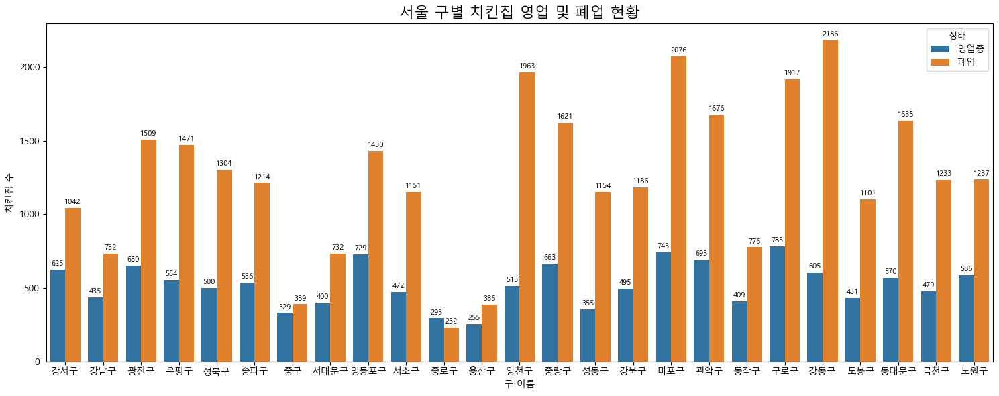

In [71]:
plt.figure(figsize=(15,6))
pt= sns.barplot(data=chikchik_melt , x='구이름', y='개수', hue='상태')
plt.title('서울 구별 치킨집 영업 및 폐업 현황', fontsize=16)
plt.xlabel('구 이름')
plt.ylabel('치킨집 수')
plt.legend(title='상태')

for container in pt.containers:
    pt.bar_label(container, label_type='edge', fontsize=8, padding=2)

plt.savefig('./서울 구별 치킨칩 영업 및 폐업 현황')
plt.tight_layout()
plt.show()

In [18]:
'''
todo:
1.지역구별 치킨 집 회귀선 그리고 이상치 찾아보기
2.지역별로 폐업률 높은곳 찾아보기
3.좌표정보로 지도에 찍어보기(내가 사는 주소)



Did
1. 서울 구별 치킨 영업 및 폐업 현황
2. 서울 구별 폐업률 현황황
'''

'\ntodo:\n1.지역구별 치킨 집 회귀선 그리고 이상치 찾아보기\n2.지역별로 폐업률 높은곳 찾아보기\n3.좌표정보로 지도에 찍어보기\n'

In [73]:
df.head()

,번호,개방서비스명,개방서비스아이디,개방자치단체코드,관리번호,인허가일자,인허가취소일자,영업상태구분코드,영업상태명,상세영업상태코드,...,보증액,월세액,다중이용업소여부,시설총규모,전통업소지정번호,전통업소주된음식,홈페이지,Unnamed: 47,지역구,동이름
0,1,일반음식점,07_24_04_P,3150000,3150000-101-2020-00448,20200803,NaN,1,영업/정상,1,...,NaN,NaN,N,35.19,NaN,NaN,NaN,NaN,강서구,마곡동
1,2,일반음식점,07_24_04_P,3150000,3150000-101-2020-00449,20200803,NaN,1,영업/정상,1,...,NaN,NaN,N,50.37,NaN,NaN,NaN,NaN,강서구,화곡동
2,3,일반음식점,07_24_04_P,3220000,3220000-101-2020-00851,20200803,NaN,1,영업/정상,1,...,0.0,0.0,N,13.65,NaN,NaN,NaN,NaN,강남구,역삼동
3,4,일반음식점,07_24_04_P,3220000,3220000-101-2020-00853,20200803,NaN,1,영업/정상,1,...,NaN,NaN,Y,123.30,NaN,NaN,NaN,NaN,강남구,대치동
4,5,일반음식점,07_24_04_P,3220000,3220000-101-2020-00855,20200803,NaN,1,영업/정상,1,...,NaN,NaN,N,8.26,NaN,NaN,NaN,NaN,강남구,삼성동


In [29]:
#결측치 제거 (좌표정보라 중간값이나,평균으로 넣을 수 없음)
chicken_w.dropna(subset=['좌표정보(x)', '좌표정보(y)'], inplace=True)

In [30]:
#결측치 제거 확인
chicken_w.loc[:,['좌표정보(x)','좌표정보(y)']].isnull().sum()

좌표정보(x)    0
좌표정보(y)    0
dtype: int64

In [ ]:
#좌표 변환
from pyproj import Transformer

# TM 좌표계에서 WGS84 좌표계로 변환
transformer = Transformer.from_crs("EPSG:2097", 'epsg:4326', always_xy=True)

# 새로운 열 추가

def transform_coords(x, y):
    lon, lat = transformer.transform(x, y)
    return lat, lon  # 위도와 경도의 순서를 바꿔서 반환

chicken_w['위도'], chicken_w['경도'] = zip(*chicken_w.apply(lambda row: 
    transform_coords(row['좌표정보(x)'], row['좌표정보(y)']), axis=1))


In [ ]:
from folium.plugins import MarkerCluster
m = folium.Map(location=[37.53897093698831, 127.05461953077439], 
							zoom_start=14)

# 지도의 중심을 데이터의 평균 위치로 설정
center_lat = chicken_w['위도'].mean()
center_lon = chicken_w['경도'].mean()

marker_cluster = MarkerCluster().add_to(m)


for idx, row in chicken_w.iterrows():
    folium.CircleMarker(
        location=[row['위도'], row['경도']],
        radius=5,  # 원의 크기 조절
        popup=folium.Popup(row['사업장명'], parse_html=True),
        color='red',
        fill=True,
        fill_color='red'
    ).add_to(marker_cluster)

m
m.save
